<a href="https://colab.research.google.com/github/PrabhatManna/Data_Augmentation_in_Deep_Learning_and_Neural_Networks_Model/blob/main/Data_Augmentation_in_Deep_Learning_and_neural_networks_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Augmentation in Deep Learning

In [ ]:
!pip install git+https://github.com/tensorflow/docs
# or
#pip install tensorflow_docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-2hi21p5y
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-2hi21p5y
  Resolved https://github.com/tensorflow/docs to commit 377cb52f6d1df66b21a4d03b42694fb9dbd93ba7
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2023.9.4.19335-py3-none-any.whl size=184104 sha256=0a2b5398b7036776529135d6c4f9f3c95027c6cc6279fc6456e47a74a9cf07eb
  Stored in directory: /tmp/pip-ephem-wheel-cache-wqzs9uon/wheels/86/0f/1e/3b62293c8ffd0fd5a49508e6871cdb7554abe9c62afd35ec53
Successfully built tensorflow-docs


In [ ]:
import urllib

import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras import layers
AUTOTUNE = tf.data.experimental.AUTOTUNE

import tensorflow_docs as tfdocs
import tensorflow_docs.plots

import tensorflow_datasets as tfds

import PIL.Image

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 5)

import numpy as np

## Download Image

2125399/2125399 [==============================] - 0s 0us/step


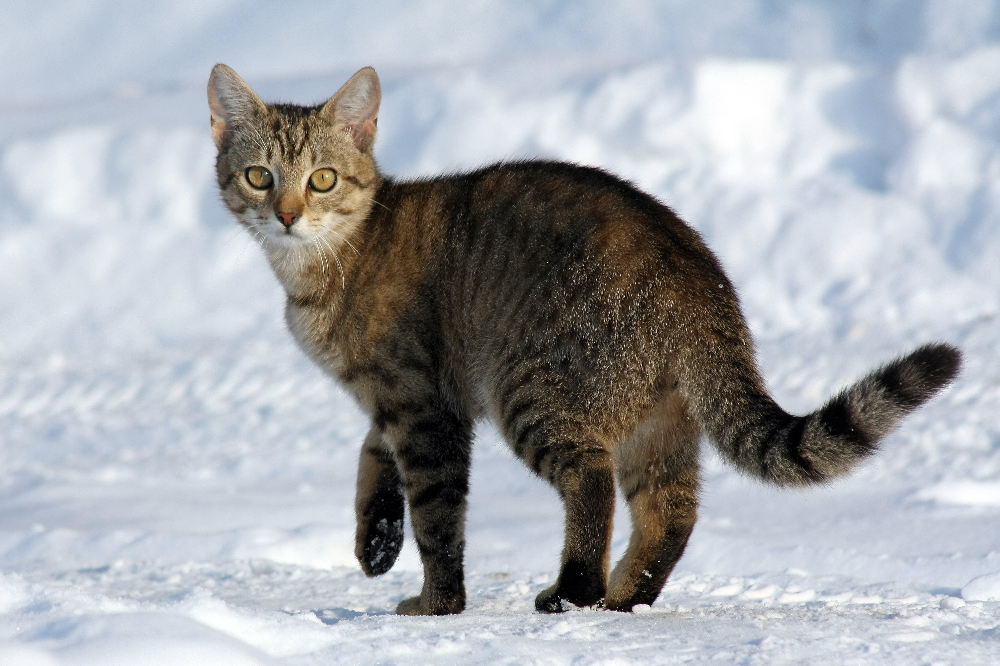

In [ ]:
image_path = tf.keras.utils.get_file("cat.jpg" , origin= "https://upload.wikimedia.org/wikipedia/commons/b/b6/Felis_catus-cat_on_snow.jpg" , extract=True)
PIL.Image.open(image_path)

In [ ]:
image_string=tf.io.read_file(image_path)
image=tf.image.decode_jpeg(image_string,channels=3)

In [ ]:
def visualize(original, augmented):
  fig = plt.figure()
  plt.subplot(1,2,1)
  plt.title('Original image')
  plt.imshow(original)

  plt.subplot(1,2,2)
  plt.title('Augmented image')
  plt.imshow(augmented)

## Data Augmentation on a Single Image

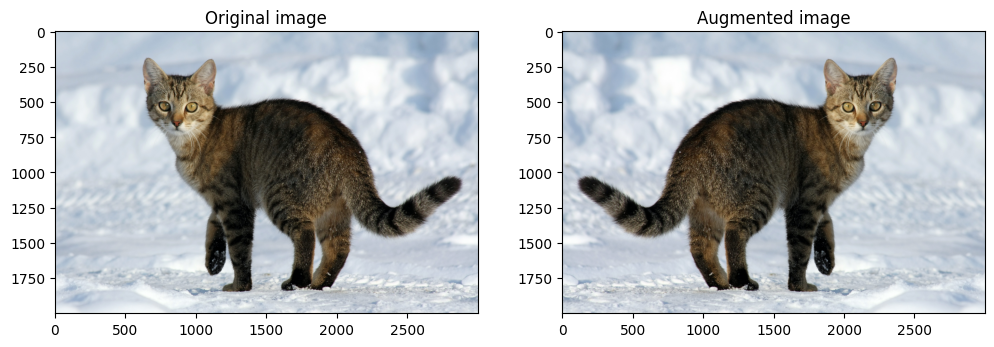

In [ ]:
flipped = tf.image.flip_left_right(image)
visualize(image, flipped)

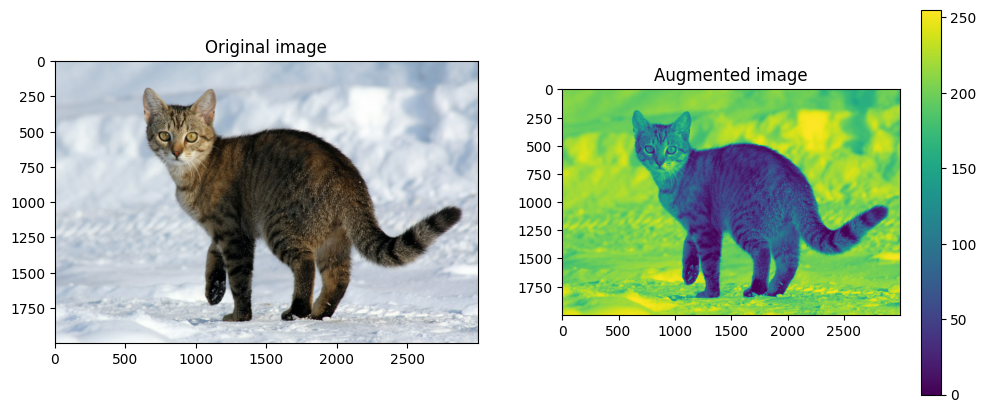

In [ ]:
grayscaled = tf.image.rgb_to_grayscale(image)
visualize(image, tf.squeeze(grayscaled))
plt.colorbar()

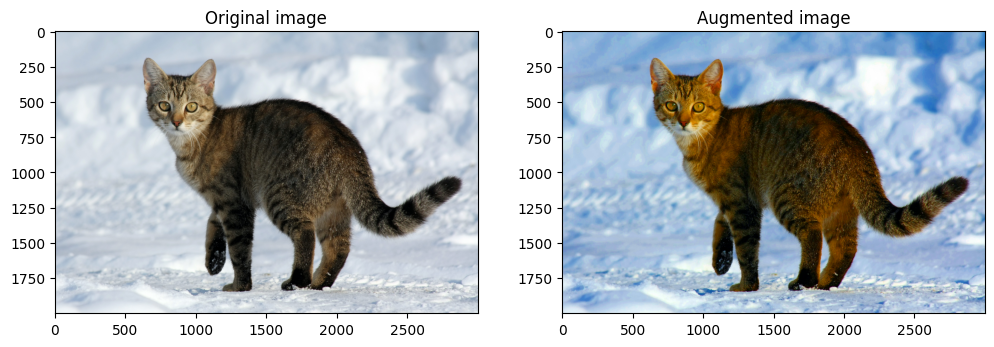

In [ ]:
saturated = tf.image.adjust_saturation(image, 3)
visualize(image, saturated)

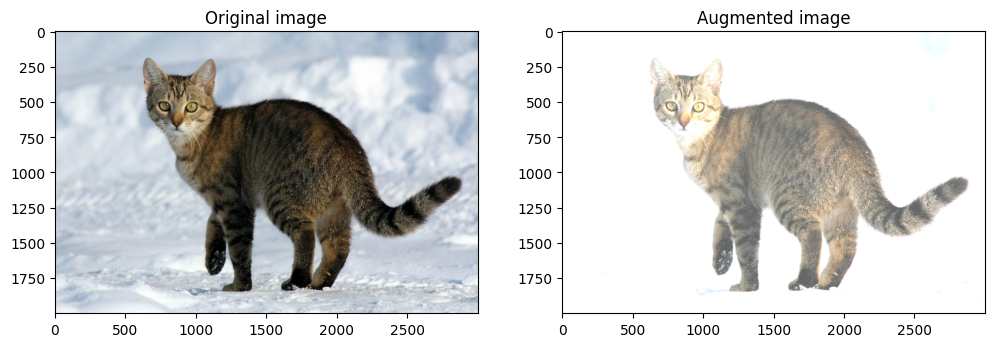

In [ ]:
bright = tf.image.adjust_brightness(image, 0.4)
visualize(image, bright)

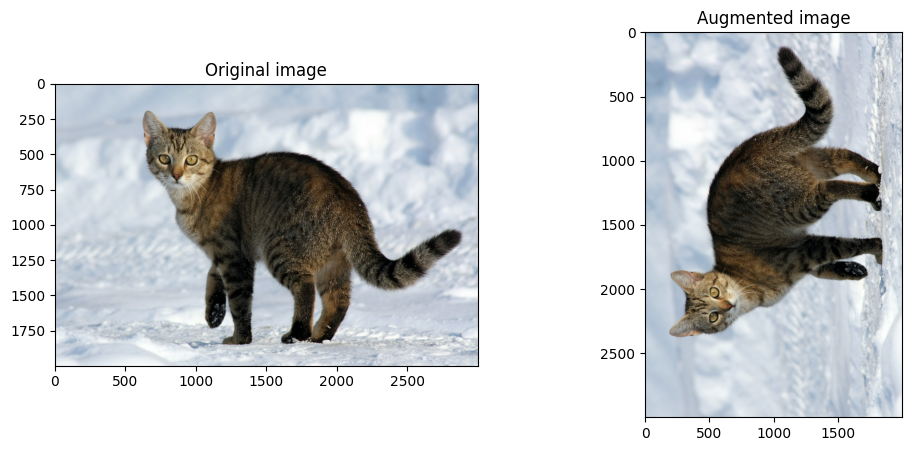

In [ ]:
rotated = tf.image.rot90(image)
visualize(image, rotated)

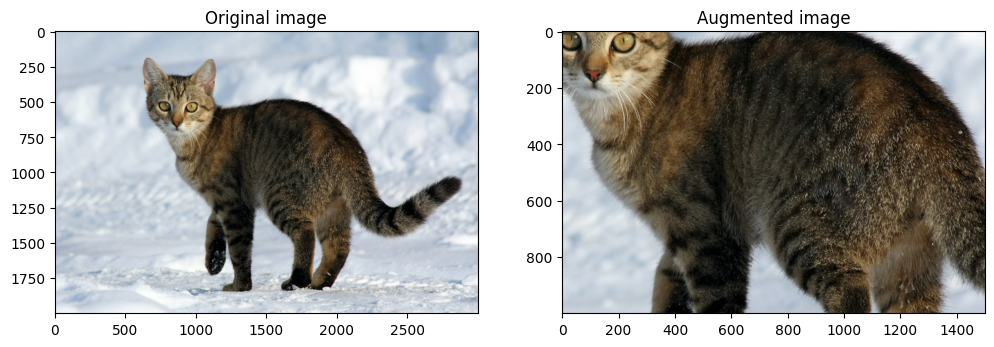

In [ ]:
cropped = tf.image.central_crop(image, central_fraction=0.5)
visualize(image,cropped)

## Data Augmentation on a Dataset and Training a Model

In [ ]:
dataset, info =  tfds.load('mnist', as_supervised=True, with_info=True)
train_dataset, test_dataset = dataset['train'], dataset['test']

num_train_examples= info.splits['train'].num_examples

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset mnist downloaded and prepared to /root/tensorflow_datasets/mnist/3.0.1. Subsequent calls will reuse this data.


In [ ]:
def convert(image, label):
  image = tf.image.convert_image_dtype(image, tf.float32) # Cast and normalize the image to [0,1]
  return image, label

def augment(image,label):
  image,label = convert(image, label)
  image = tf.image.convert_image_dtype(image, tf.float32) # Cast and normalize the image to [0,1]
  image = tf.image.resize_with_crop_or_pad(image, 34, 34) # Add 6 pixels of padding
  image = tf.image.random_crop(image, size=[28, 28, 1]) # Random crop back to 28x28
  image = tf.image.random_brightness(image, max_delta=0.5) # Random brightness

  return image,label
BATCH_SIZE = 64
# Only use a subset of the data so it's easier to overfit, for this tutorial
NUM_EXAMPLES = 2048

In [ ]:
augmented_train_batches = (
    train_dataset
    # Only train on a subset, so you can quickly see the effect.
    .take(NUM_EXAMPLES)
    .cache()
    .shuffle(num_train_examples//4)
    # The augmentation is added here.
    .map(augment, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

In [ ]:
non_augmented_train_batches = (
    train_dataset
    # Only train on a subset, so you can quickly see the effect.
    .take(NUM_EXAMPLES)
    .cache()
    .shuffle(num_train_examples//4)
    # No augmentation.
    .map(convert, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

In [ ]:
validation_batches = (
    test_dataset
    .map(convert, num_parallel_calls=AUTOTUNE)
    .batch(2*BATCH_SIZE)
)

In [ ]:
def make_model():
  model = tf.keras.Sequential([
      layers.Flatten(input_shape=(28, 28, 1)),
      layers.Dense(4096, activation='relu'),
      layers.Dense(4096, activation='relu'),
      layers.Dense(10)
  ])
  model.compile(optimizer = 'adam',
                loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])
  return model

## Training the Model

In [ ]:
model_without_aug = make_model()

no_aug_history = model_without_aug.fit(non_augmented_train_batches, epochs=50, validation_data=validation_batches)

Epoch 1/50
32/32 [==============================] - 50s 2s/step - loss: 0.6955 - accuracy: 0.7788 - val_loss: 0.3832 - val_accuracy: 0.8867
Epoch 2/50
32/32 [==============================] - 37s 1s/step - loss: 0.1816 - accuracy: 0.9409 - val_loss: 0.2888 - val_accuracy: 0.9133
Epoch 3/50
32/32 [==============================] - 37s 1s/step - loss: 0.0752 - accuracy: 0.9756 - val_loss: 0.3150 - val_accuracy: 0.9162
Epoch 4/50
32/32 [==============================] - 26s 826ms/step - loss: 0.0789 - accuracy: 0.9727 - val_loss: 0.3328 - val_accuracy: 0.9149
Epoch 5/50
32/32 [==============================] - 27s 862ms/step - loss: 0.0671 - accuracy: 0.9814 - val_loss: 0.5705 - val_accuracy: 0.8759
Epoch 6/50
32/32 [==============================] - 36s 1s/step - loss: 0.0597 - accuracy: 0.9790 - val_loss: 0.3378 - val_accuracy: 0.9232
Epoch 7/50
32/32 [==============================] - 26s 826ms/step - loss: 0.0191 - accuracy: 0.9946 - val_loss: 0.3849 - val_accuracy: 0.9201
Epoch 8/50


In [ ]:
model_with_aug = make_model()

aug_history = model_with_aug.fit(augmented_train_batches, epochs=50, validation_data=validation_batches)

Epoch 1/50
32/32 [==============================] - 38s 1s/step - loss: 2.5555 - accuracy: 0.2690 - val_loss: 1.3706 - val_accuracy: 0.5948
Epoch 2/50
32/32 [==============================] - 37s 1s/step - loss: 1.4794 - accuracy: 0.4932 - val_loss: 0.8223 - val_accuracy: 0.7749
Epoch 3/50
32/32 [==============================] - 37s 1s/step - loss: 1.0797 - accuracy: 0.6353 - val_loss: 0.5906 - val_accuracy: 0.8407
Epoch 4/50
32/32 [==============================] - 37s 1s/step - loss: 0.8252 - accuracy: 0.7305 - val_loss: 0.4304 - val_accuracy: 0.8682
Epoch 5/50
32/32 [==============================] - 37s 1s/step - loss: 0.7411 - accuracy: 0.7515 - val_loss: 0.3318 - val_accuracy: 0.9102
Epoch 6/50
32/32 [==============================] - 37s 1s/step - loss: 0.6151 - accuracy: 0.7993 - val_loss: 0.3264 - val_accuracy: 0.9007
Epoch 7/50
32/32 [==============================] - 37s 1s/step - loss: 0.5191 - accuracy: 0.8184 - val_loss: 0.2686 - val_accuracy: 0.9239
Epoch 8/50
32/32 [==

(0.75, 1.0)

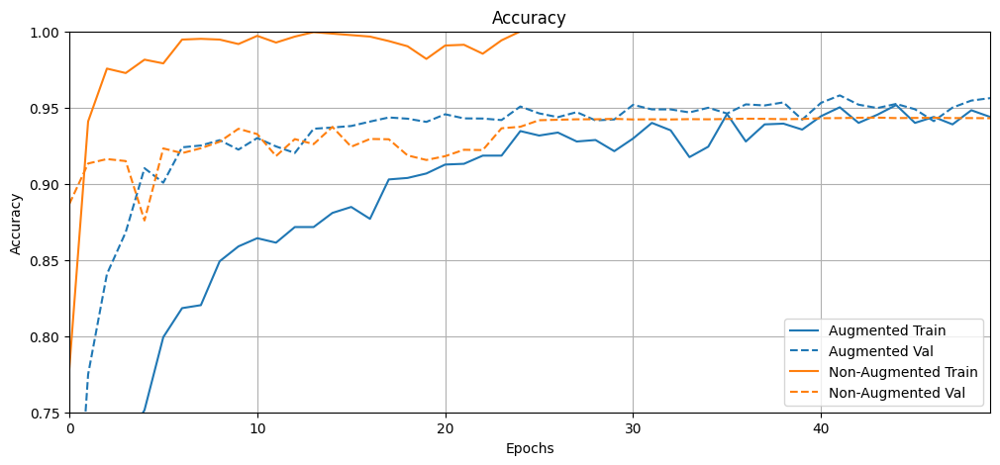

In [ ]:
plotter = tfdocs.plots.HistoryPlotter()
plotter.plot({"Augmented": aug_history, "Non-Augmented": no_aug_history}, metric = "accuracy")
plt.title("Accuracy")
plt.ylim([0.75,1])